# How does it work?

In [28]:
from chessChecker import checker
import caseSplitter.splitter
import characterExtracter.extracter
import characterPredicter.predicter
from scanner.scan import scan

from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

In [37]:
checker.init(checker.ChessLanguage.SAN_FRENCH)
# startingImagePath = "YOUR_PHOTO_OF_GAME_SHEET"
startingImagePath = "testSheets/image3.jpg"

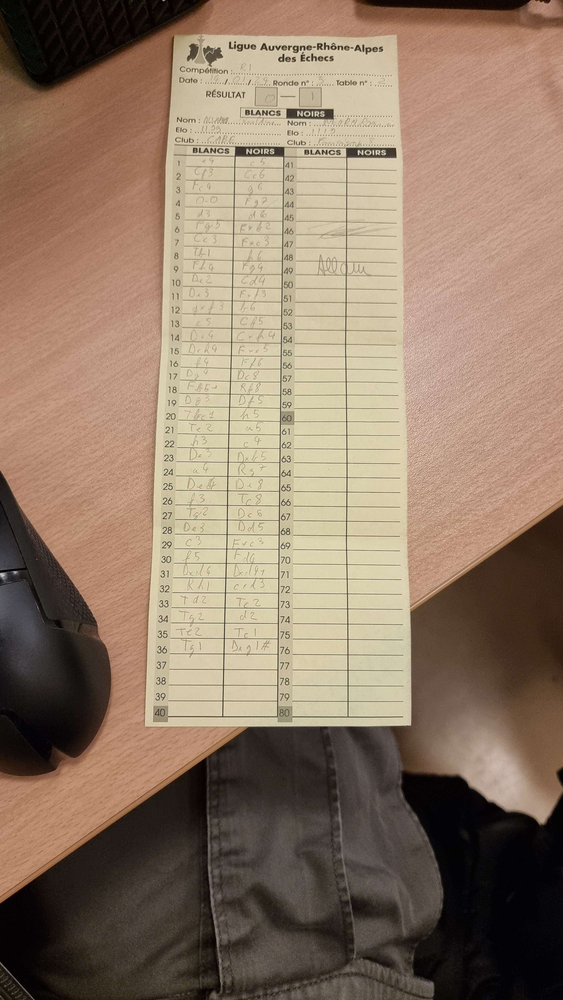

In [39]:
imageStart = Image.open(startingImagePath)

imageStart

---
## Step 1: Scan the image and get the cropped game sheet
First, we need to scan the image and get the game sheet only. The game sheet is the part of the image that contains the game.
To do so, we use the scan function from the scanner module.

---
This function first removes the background of the image. It then thresholds the image to get a binary image where the game sheet is white and the rest is black. It then finds the contours of the white areas and keeps the biggest one. Finally, it makes a perspective transformation to get the game sheet only centered in the image.

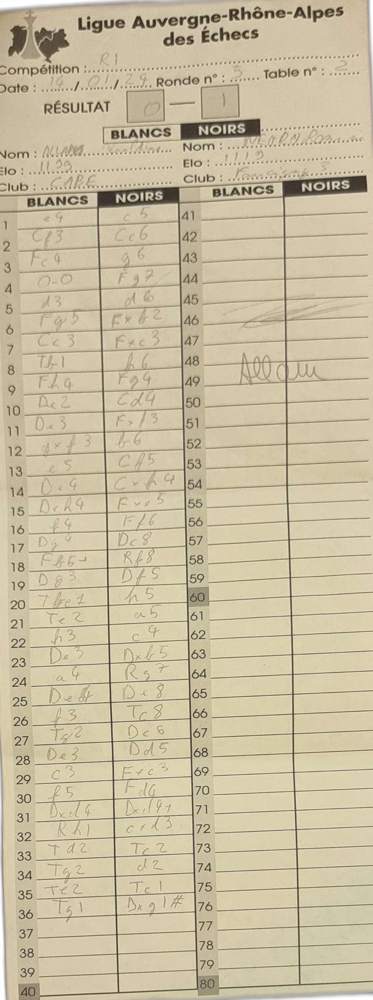

In [40]:
# Step 1: Scan the image and get the cropped game sheet
imageScanned = scan(imageStart)

imageScanned

---
## Step 2: Cut the image's move cases
Now that we have the game sheet, we need to cut the image into the different move cases. Each move case is delimited by the black lines on the game sheet. We use the caseSplitter module to do so.

---
First, this function takes a gaussian blur of the grayscale image to remove the noise. It then performs an edge detection using the Canny algorithm.

It then finds the main vertical lines of the image using the Hough transform and keeps the 3 most likely lines. Those lines represent the vertical lines of the move cases.

It then finds the main horizontal lines of the image using the Hough transform under the condition that they are under a sixth of the height of the image. This is to avoid finding the possible horizontal lines that can appear in the header. We know there should be 42 main horizontal lines spaced by a relatively constant distance. We state that the top line is part of the 42 lines and then find the 41 other lines. To do so, we look around the spot where there should be a line and find the most likely line. If none is found, we store this position as missing and continue forward. Else we store the best candidate as the line and continue forward.

Then for each group of consecutive missing lines, we complete evenly the missing lines using the surrounding lines.

Finally, we cut the image into the different move cases using the intersections of the vertical and horizontal lines. On each case, we add a margin to avoid cutting the characters and perform a perspective transformation to get the case straight.

We then return the list of 160 move cases, each containing a move, 2 cases for each move number for a total of 80 moves.

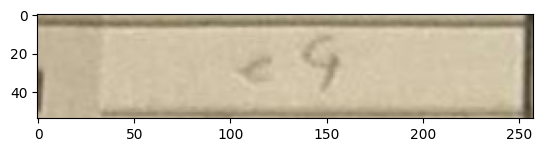

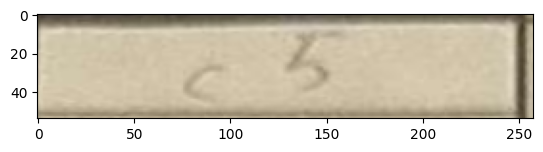

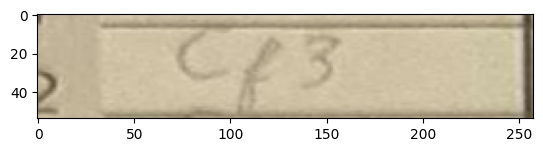

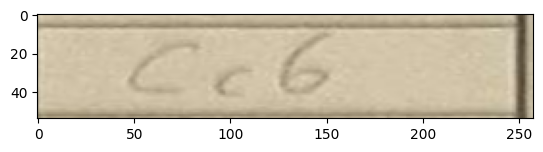

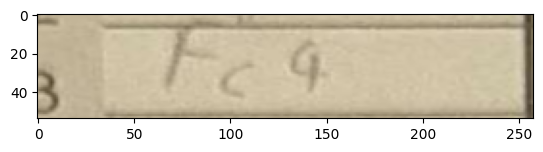

In [41]:
# Step 2: Cut the image's move cases
moveCases = caseSplitter.splitter.split(imageScanned)

for i in range(5):
	plt.imshow(moveCases[i])
	plt.show()

---
## Step 3: Slice each move case character by character

Now that we have the move cases, we need to slice each move case character by character. We use the characterExtracter module to do so.

---
We first transform the image to grayscale and then threshold it to get a binary image. In this case, we use an adaptative threshold to get the best result fine-tuned to both avoid missing or spliting characters and avoid getting too much noise.

We then find the contours of the characters and keep the most likely ones. We assert that the characters should not be smaller than a 10x10 square, not wider than 70 pixels and not thiner than 5 pixels. We also assert that the characters should not be too close to the left border of the image to avoid getting the move number.

Finally, we return the list of characters, each being an binary image of a character, white on black.

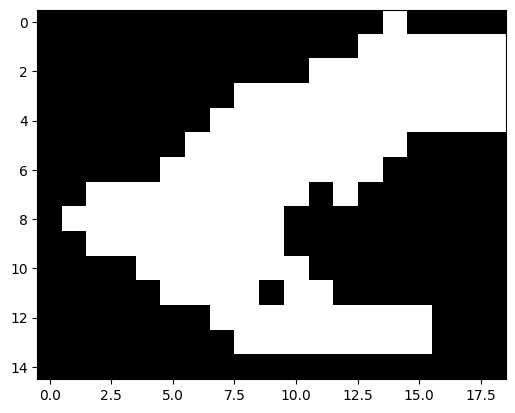

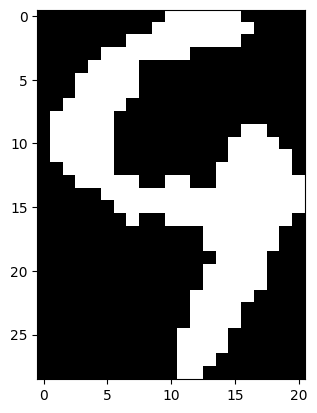

In [42]:
# Step 3: Slice each move case character by character
chars = characterExtracter.extracter.extract_characters(moveCases[0], moveCases.index(moveCases[0]))
for im in chars:
	plt.imshow(im)
	plt.show()

---
## Step 4: Predict each character with the model

Now that we have the characters, we need to predict each character with the model. We use the characterPredicter module to do so.

---
On each character, we resize the image to 64x64 with a variable margin (from no margin to 10 pxl of white) to avoid the character to be too close to the border.
We then predict on each of those images the characters with the highest probability. It uses an homemade model trained on selected useful characters from the [UNIPEN online handwriting database](https://s3-eu-west-1.amazonaws.com/handwriting-curated-database/curated.tar.gz). See how the model was trained in the [training notebook](training_char_recog.ipynb).

Finally, we sum the probabilities of each character and return the 5 most likely characters.



In [43]:
# Step 4: Predict each character with the model
# Each character is an image that needs to be resized to 64x64. The model will predict the 5 most likely characters
predictions = []
for char in chars:
	predictions.append(characterPredicter.predicter.predictTop5(char))
predictions

[[('#', 4.1722247185053725),
  ('e', 3.82744560347336),
  ('K', 1.9653165372660903),
  ('c', 0.033812673037449954),
  ('O', 1.484633555280518e-08)],
 [('4', 5.936378332374544),
  ('f', 4.003303272554366),
  ('F', 0.04484651220010919),
  ('#', 0.0005014460829333366),
  ('Q', 1.0236598920737597e-11)]]

---
## Step 5: Get all the valid moves and their probabilities

Now that we have the predictions, we need to get all the valid moves and their probabilities. To do so, we use the chessChecker module to check if the move is valid. If it is, we add it to the list of valid moves with the probability of the move being the product of the probabilities of each character.

---
To check if the move is valid, we keep a live chess board and check in all the possible moves if the move exists in the current language of the board. If it does, we return True, else we return False.

Finally, we return the list of valid moves with their probabilities.

In [45]:
# Step 5: Get all the valid moves and their probabilities
moves = []
for i in range(5 ** len(predictions)):
	indexes = [i // (5 ** j) % 5 for j in range(len(predictions))]
	if any([len(predictions[j]) <= indexes[j] for j in range(len(predictions))]):
		continue
	globalMove = "".join([predictions[j][indexes[j]][0] for j in range(len(predictions))])
	if checker.validMove(globalMove):
		moves.append(
			(globalMove, np.prod([predictions[j][i // (5 ** j) % 5][1] for j in range(len(predictions))])))
moves

[('e4', 22.721165148801468), ('c4', 0.20072481957918287)]

---
## Step 6: Get the most likely move based on the predictions

Now that we have the valid moves and their probabilities, we need to get the most likely move based on the predictions. If there's no move or if the move is not likely enough, we prompt the user to enter the move. If the move is sufficiently likely, we ask the user if the move is correct, if not, we prompt the user to enter which move it is. If the entered move is "E", it means that the game ended by an oral agreement (either a draw or a resignation). We then ask the user what the result is and if the result is valid, we return the result.

In [ ]:
# Step 6: Get the most likely move based on the predictions
moves.sort(key=lambda x: x[1], reverse=True)
if len(moves) == 0:
	# If no move is likely enough, prompt the user to enter the move
	# move = getMoveFromUser()
	move = "e4"
else:
	move = moves[0]
	if move[1] < 0.5:
		# If the move is not likely enough, prompt the user to enter which move it is
		# move = getMoveFromUser()
		move = "e4"
	else:
		# Ask the user if the move is correct, if not, prompt the user to enter which move it is
		# move = askUserRightMove(move)
		...
result = None
if move == "E":
	# It means that the game ended by an oral agreement
	# Ask the user what the result is
	while result not in range(4):
		result = input("What is the result of the game? (0: white wins, 1: draw, 2: black wins, 3: unknown): ")
	result = ["1-0", "1/2-1/2", "0-1", "*"][result]
else:
	move = (move[0].lower(), move[1])
	# Add the move to the game
	checker.doMove(move[0])
	if checker.CURRENT_BOARD.is_game_over():
		...


Repeat the process for each move case.

Finally, we recompose the PGN string (which is, in short, composed of all the moves and the result of the game) and returns it.

In [ ]:
# Step 6: Recompose the PGN string and return it
checker.getPGN(result)